# Part_02_EDA

Here the saved data from P01 is loaded and some analysis is done. Later is fed into the LSTM for modeling.

In [1]:
import tensorflow as tf
tf.__version__

'2.6.0'

In [2]:
import sys
# print(sys.executable)

In [3]:
# !/Users/amin/Desktop/proj/env/bin/python -m pip install matplotlib

In [4]:
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras

In [6]:
import pandas as pd
import numpy as np
import seaborn as sns

In [7]:
%config InlineBackend.figure_format = 'retina'


In [24]:
section_fig_main_title = 'P02_01_EDA_'

### Read data

In [9]:
csv_path = "../Data/jena_climate_2009_2016.csv"
df = pd.read_csv(csv_path)

let's get an intuition of feathers in data by printing the data first 5 rows.

In [10]:
df.head()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3


In [11]:
df.columns

Index(['Date Time', 'p (mbar)', 'T (degC)', 'Tpot (K)', 'Tdew (degC)',
       'rh (%)', 'VPmax (mbar)', 'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)',
       'H2OC (mmol/mol)', 'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)',
       'wd (deg)'],
      dtype='object')

In [12]:
df.columns.size

15

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420551 entries, 0 to 420550
Data columns (total 15 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Date Time        420551 non-null  object 
 1   p (mbar)         420551 non-null  float64
 2   T (degC)         420551 non-null  float64
 3   Tpot (K)         420551 non-null  float64
 4   Tdew (degC)      420551 non-null  float64
 5   rh (%)           420551 non-null  float64
 6   VPmax (mbar)     420551 non-null  float64
 7   VPact (mbar)     420551 non-null  float64
 8   VPdef (mbar)     420551 non-null  float64
 9   sh (g/kg)        420551 non-null  float64
 10  H2OC (mmol/mol)  420551 non-null  float64
 11  rho (g/m**3)     420551 non-null  float64
 12  wv (m/s)         420551 non-null  float64
 13  max. wv (m/s)    420551 non-null  float64
 14  wd (deg)         420551 non-null  float64
dtypes: float64(14), object(1)
memory usage: 48.1+ MB


In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
p (mbar),420551.0,989.212776,8.358481,913.60,984.20,989.58,994.72,1015.35
T (degC),420551.0,9.450147,8.423365,-23.01,3.36,9.42,15.47,37.28
Tpot (K),420551.0,283.492743,8.504471,250.60,277.43,283.47,289.53,311.34
Tdew (degC),420551.0,4.955854,6.730674,-25.01,0.24,5.22,10.07,23.11
rh (%),420551.0,76.008259,16.476175,12.95,65.21,79.30,89.40,100.00
VPmax (mbar),420551.0,13.576251,7.739020,0.95,7.78,11.82,17.60,63.77
VPact (mbar),420551.0,9.533756,4.184164,0.79,6.21,8.86,12.35,28.32
VPdef (mbar),420551.0,4.042412,4.896851,0.00,0.87,2.19,5.30,46.01
sh (g/kg),420551.0,6.022408,2.656139,0.50,3.92,5.59,7.80,18.13
H2OC (mmol/mol),420551.0,9.640223,4.235395,0.80,6.29,8.96,12.49,28.82


### Basic plots

In [15]:
# plt.figure(figsize=(15,5))

# plt.subplot(1, 3, 1)
# plt.hist(df['p (mbar)'], bins=25,  ec='k', log=False, color=('b'))
# plt.title('non-log scale', fontsize=12)
# plt.legend(['p (mbar)'])
# plt.xlabel('p (mbar)'); plt.ylabel('count')

# plt.subplot(1, 3, 2)
# plt.hist(df['p (mbar)'], bins=25,  ec='k', log=True, color=('b'))
# plt.title('log scale', fontsize=12)
# plt.legend(['p (mbar)'])
# plt.xlabel('p (mbar)'); plt.ylabel('count')

# plt.subplot(1, 3, 3)
# plt.plot(df['p (mbar)'],'k-')
# plt.xlabel("time")
# plt.ylabel("p (mbar)")
# plt.title("pressure")

build a function for above plot.

In [25]:
def plot_df(col_name):
    plt.figure(figsize=(15,5))

    plt.subplot(1, 3, 1)
    plt.hist(df[col_name], bins=25,  ec='k', log=False, color=('b'))
    plt.title('non-log scale', fontsize=12)
    plt.legend([col_name])
    plt.xlabel(col_name); plt.ylabel('count')

    plt.subplot(1, 3, 2)
    plt.hist(df[col_name], bins=25,  ec='k', log=True, color=('b'))
    plt.title('log scale', fontsize=12)
    plt.legend([col_name])
    plt.xlabel(col_name); plt.ylabel('count')

    plt.subplot(1, 3, 3)
    plt.plot(df[col_name],'k-')
    plt.xlabel("time")
    plt.ylabel(col_name)
    plt.title(col_name)

    col_name = col_name.replace(' ', '_')
    col_name = col_name.replace('/', '_')
#     plt.savefig(f'../Figures/plot_P02_EDA_{col_name}.png')
    addres = '../Figures/'
    plt.savefig(addres + section_fig_main_title + f'{col_name}.png')
    plt.show()

select the columns and pass it to the plot function.

In [26]:
cols = ['p (mbar)', 'T (degC)', 'Tpot (K)', 'Tdew (degC)',
       'rh (%)', 'VPmax (mbar)', 'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)',
       'H2OC (mmol/mol)', 'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)',
       'wd (deg)']

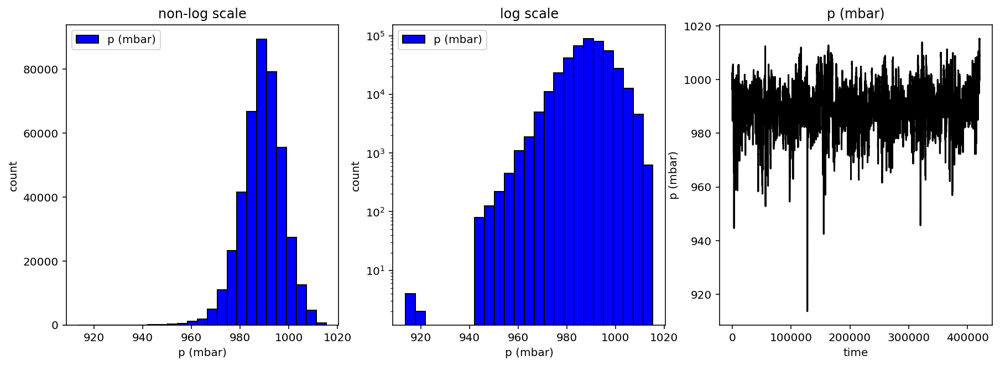

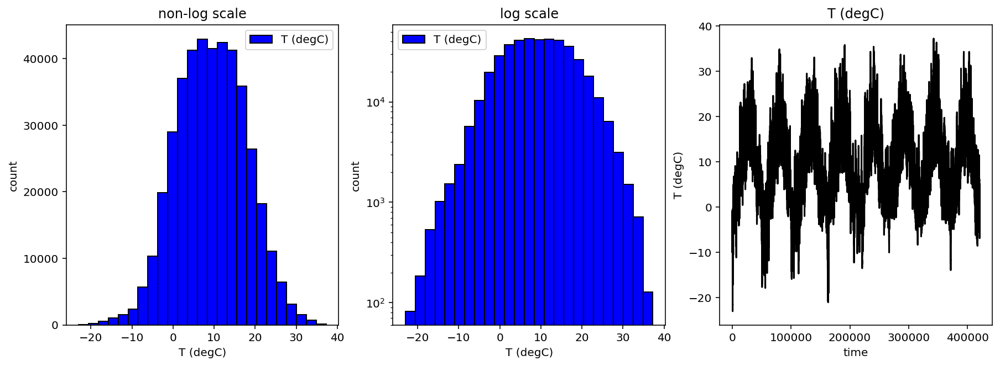

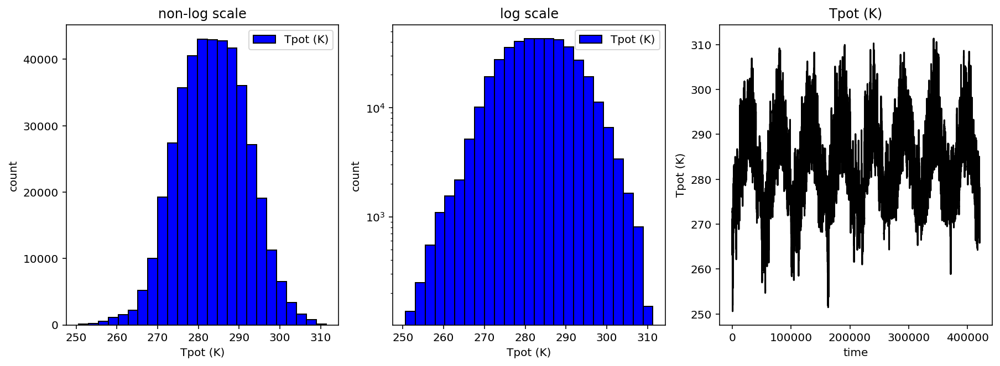

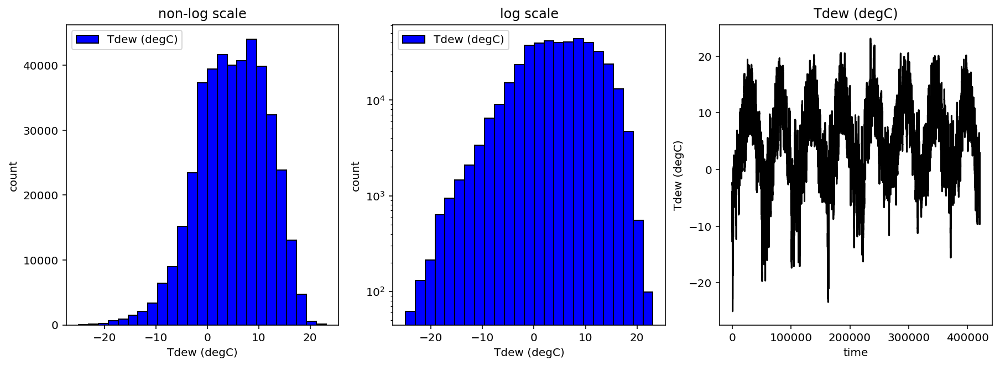

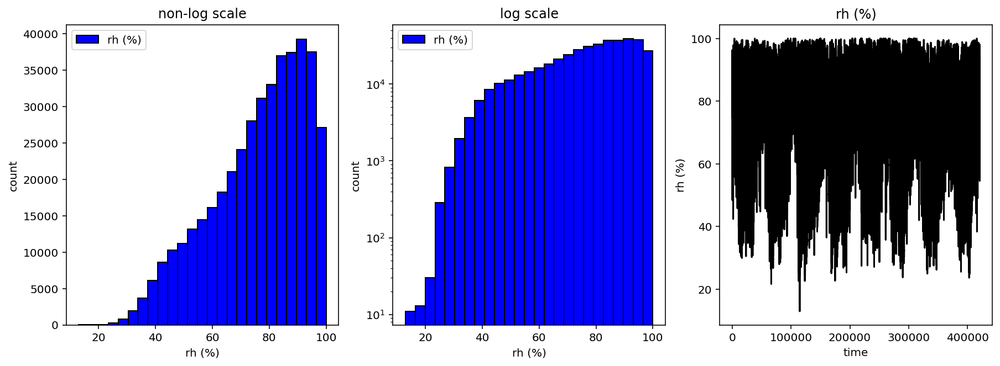

...

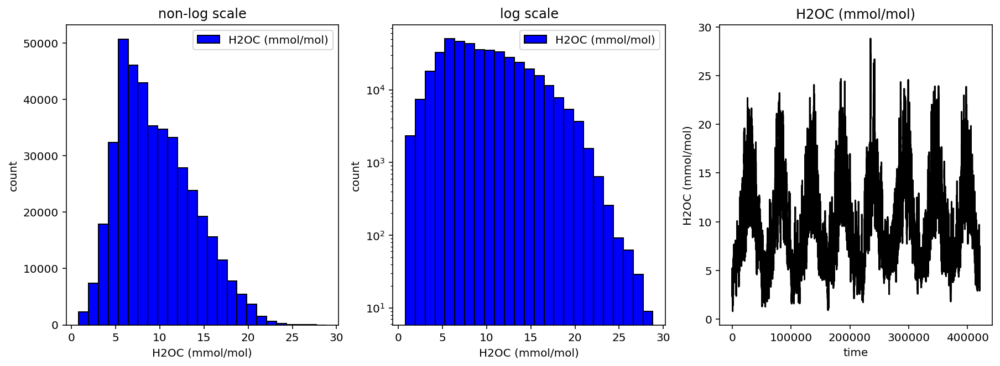

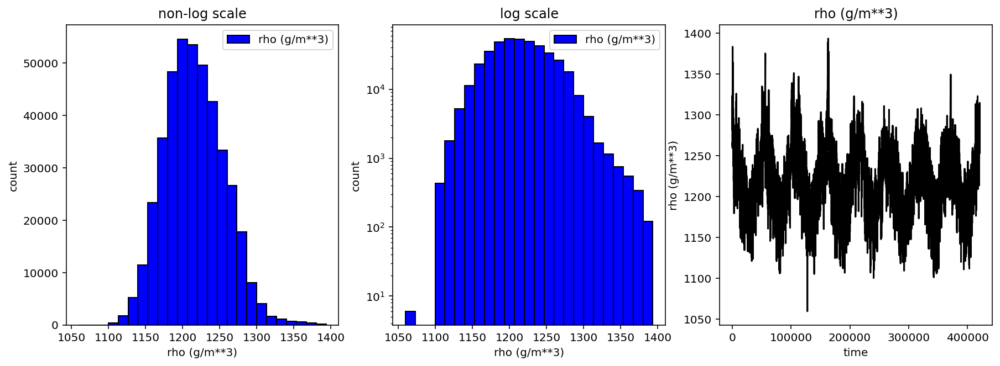

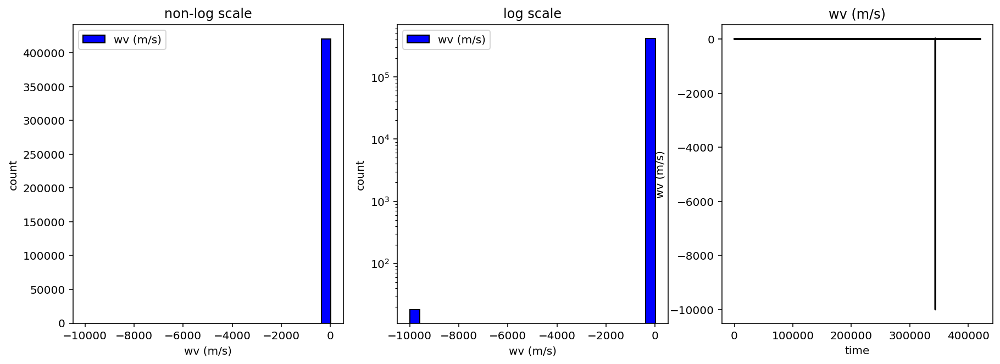

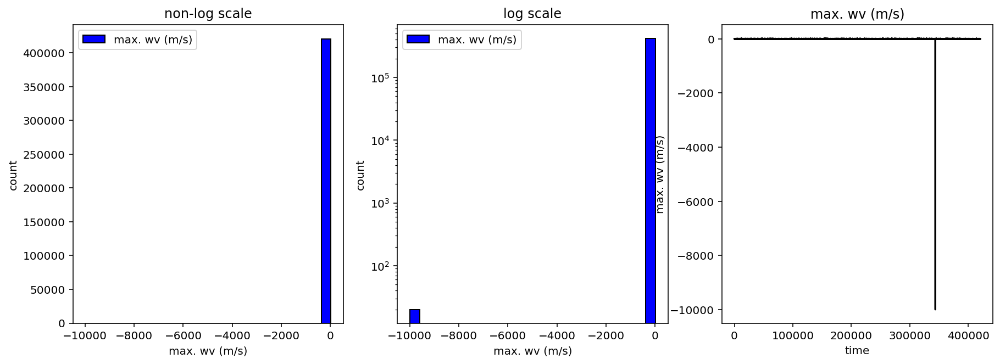

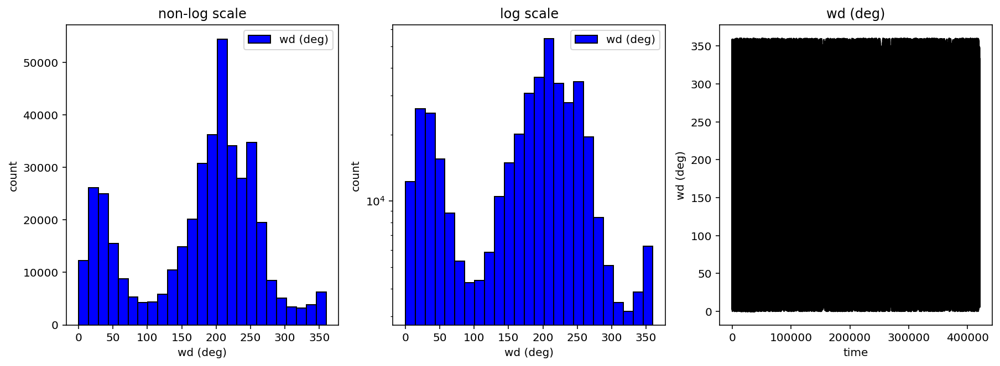

In [27]:
for col in cols:
    plot_df(col)

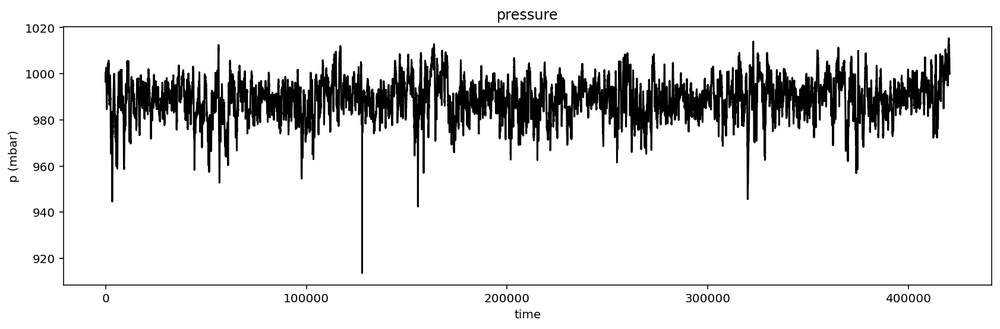

In [28]:
plt.figure(figsize = [14, 4])
plt.plot(df['p (mbar)'],'k-')
plt.xlabel("time")
plt.ylabel("p (mbar)")
plt.title("pressure")
plt.savefig("../Figures/" + section_fig_main_title + "pressure.png")

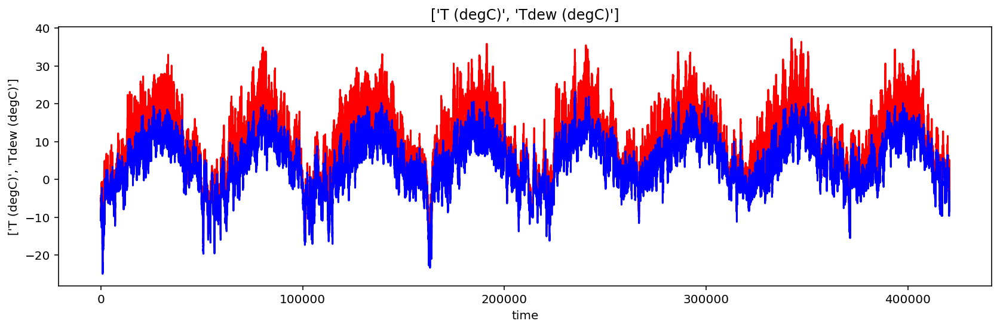

In [29]:
# %config InlineBackend.figure_format = 'retina'
plt.figure(figsize = [14, 4])

# cols = ['Date Time', 'p (mbar)', 'T (degC)', 'Tpot (K)', 'Tdew (degC)',
#        'rh (%)', 'VPmax (mbar)', 'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)',
#        'H2OC (mmol/mol)', 'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)',
#        'wd (deg)']

cols = ['T (degC)', 'Tdew (degC)']
colors = ['r', 'b']

for i,col in enumerate(cols):
    plt.plot(df[col],colors[i])

plt.xlabel("time")
plt.ylabel(cols)
plt.title(cols)
plt.savefig("../Figures/" + section_fig_main_title + "T_(degC)_Tdew_(degC).png")

seasonality trends is observed exccept for parameters: ```['wv (m/s)', 'max. wv (m/s)','wd (deg)']```

Lets check out if the data is stationary. Two methods can be used for evaluating the time series data inclduing, Plotting Rolling Statistics and Dickey-Fuller Test.


In [12]:
# modified ref: https://www.kaggle.com/kanncaa1/time-series-prediction-tutorial-with-eda
# adfuller library 
from statsmodels.tsa.stattools import adfuller

In [13]:
# !/Users/amin/Desktop/proj/env/bin/python -m pip install statsmodels

In [30]:
# check_adfuller
def check_adfuller(ts):
    # Dickey-Fuller test
    result = adfuller(ts, autolag='AIC')
    print('Test statistic: ' , result[0])
    print('p-value: '  ,result[1])
    print('Critical Values:' ,result[4])
    
# check_mean_std
def check_mean(ts,windo):
    #Rolling statistics
    
    rolmean = pd.Series(ts).rolling(window=windo).mean()
    rolstd = pd.Series(ts).rolling(window=windo).std()
    
    
#     rolmean = pd.rolling_mean(ts, window=6)
#     rolstd = pd.rolling_std(ts, window=6)
    plt.figure(figsize=(22,10))   
    orig = plt.plot(ts, color='red',label='Original')
    mean = plt.plot(rolmean, color='black', label='Rolling Mean')
#     std = plt.plot(rolstd, color='green', label = 'Rolling Std')
    plt.xlabel("Date")
    plt.ylabel("Mean Pressure")
    plt.title('Rolling Mean')
    
#     plt.ylim(0,)
    
    plt.legend()
    plt.show()
    
    
    
# check_mean_std
def check_std(ts, windo):
    #Rolling statistics
    
    rolmean = pd.Series(ts).rolling(window=windo).mean()
    rolstd = pd.Series(ts).rolling(window=windo).std()
    
    
#     rolmean = pd.rolling_mean(ts, window=6)
#     rolstd = pd.rolling_std(ts, window=6)
    plt.figure(figsize=(22,10))   
#     orig = plt.plot(ts, color='red',label='Original')
#     mean = plt.plot(rolmean, color='black', label='Rolling Mean')
    std = plt.plot(rolstd, color='green', label = 'Rolling Std')
    plt.xlabel("Date")
    plt.ylabel("Mean Pressure")
    plt.title('Rolling Standard Deviation')
    
#     plt.ylim(0,)
    
    plt.legend()
    plt.show()

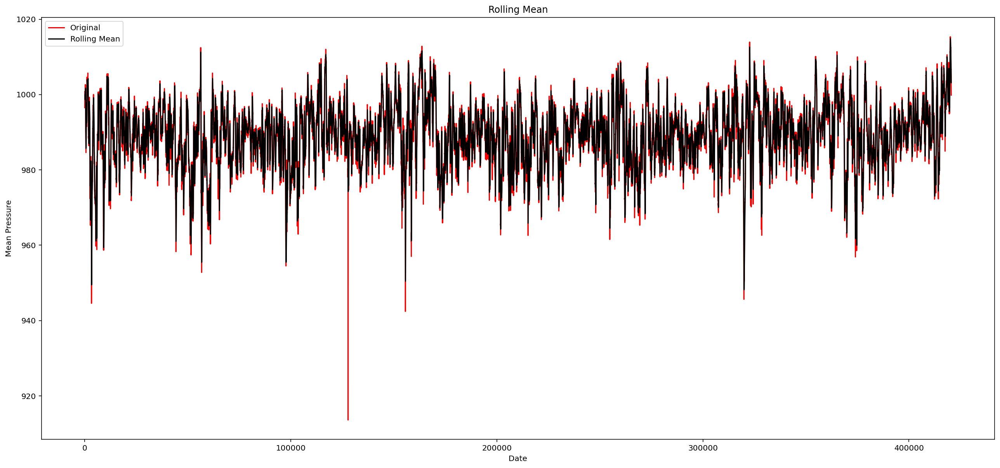

In [31]:
# check stationary: mean, variance(std)and adfuller test
check_mean(df['p (mbar)'], windo=100)

check out the first 10_000 row of data for pressure.

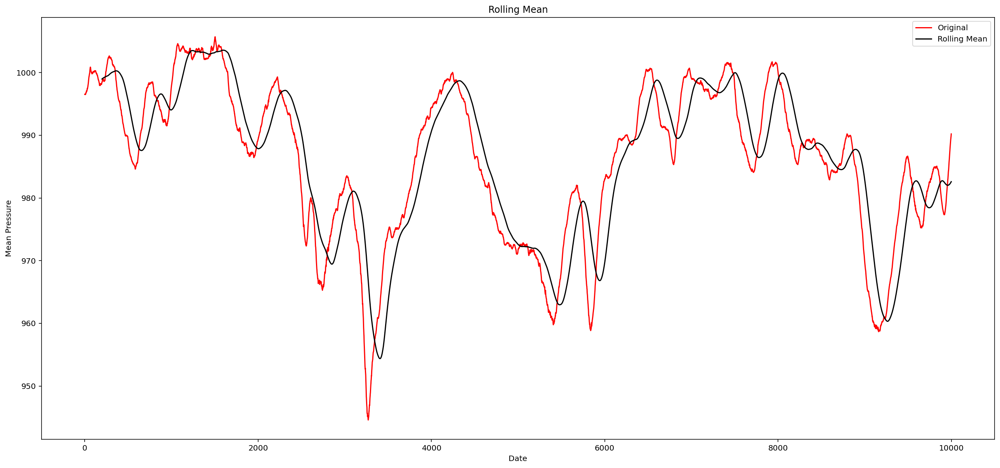

In [32]:
check_mean(df['p (mbar)'][0:10000], windo=200)

it is seen that the mean is not constant (black curve) so it looks like that we do have ```NO STATIONARY``` pressure data.

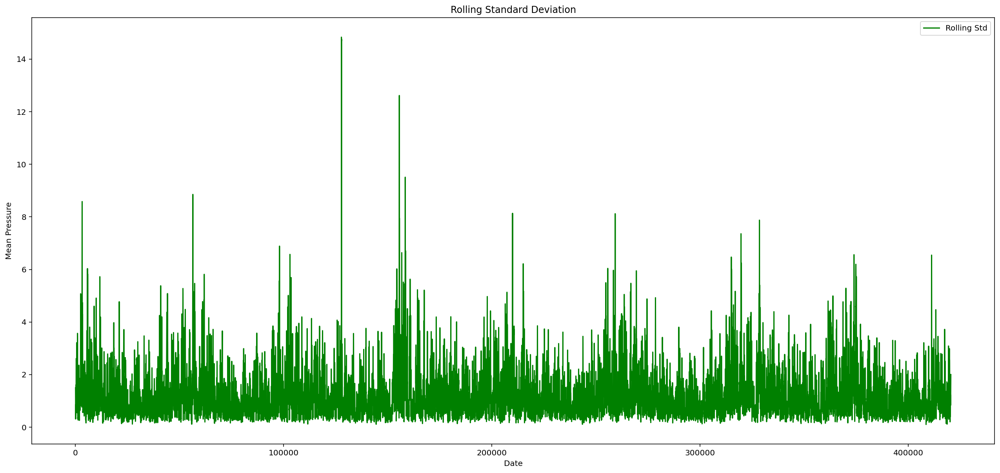

In [33]:
check_std(df['p (mbar)'], windo=100)

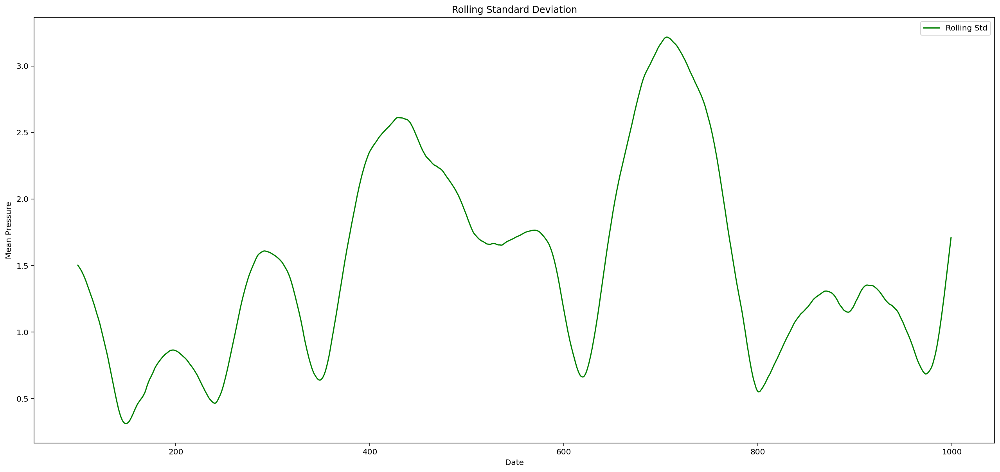

In [34]:
check_std(df['p (mbar)'][0:1000], windo=100)

the std of data is almost constant so we can say we do have ```SATIONARY``` pressure data.

Let's check out the last method and see if the data is stationary.

Using adfuller to find out if the data is stationary:

If the test statistic is less than the critical value, we can say that the time series is stationary.

In [43]:
check_adfuller(df['p (mbar)'][0:100_000])

Test statistic:  -12.990582118066978
p-value:  2.8180569490639252e-24
Critical Values: {'1%': -3.4304154365591524, '5%': -2.861568921933749, '10%': -2.5667853941333254}


the adfuller shows the pressure data is ```STATIONARY```.

let's make a function to check out the all data.

In [35]:
# check_mean_std
def check_mean_std(ts, windo, col_name):
    
    plt.figure(figsize=(22,5))   
    #Rolling statistics
    plt.subplot(1, 2, 1)
    rolmean = pd.Series(ts).rolling(window=windo).mean()
    rolstd = pd.Series(ts).rolling(window=windo).std()
#     rolmean = pd.rolling_mean(ts, window=6)
#     rolstd = pd.rolling_std(ts, window=6)
    
    orig = plt.plot(ts, color='red',
                    label='Original')
    mean = plt.plot(rolmean, color='black', 
                    label='Rolling Mean')
    plt.xlabel("Date")
    plt.ylabel(f"Mean_{col_name}")
    plt.title('Rolling Mean')
    plt.legend()
    
    
#     plt.show()
    plt.subplot(1, 2, 2)
    std = plt.plot(rolstd, color='green', 
                   label = 'Rolling Std')
    plt.xlabel("Date")
    plt.ylabel(f"Mean_{col_name}")
    plt.title('Rolling STD')

#     plt.ylim(0,)

    plt.legend()
    
    col_name = col_name.replace(' ', '_')
    col_name = col_name.replace('/', '_')
    addres = '../Figures/'
    plt.savefig(addres + section_fig_main_title + f'stationary_windo_{windo}_{col_name}.png')
    
    plt.show()




In [36]:
cols = ['p (mbar)', 'T (degC)', 'Tpot (K)', 'Tdew (degC)',
       'rh (%)', 'VPmax (mbar)', 'VPact (mbar)', 'VPdef (mbar)', 'sh (g/kg)',
       'H2OC (mmol/mol)', 'rho (g/m**3)', 'wv (m/s)', 'max. wv (m/s)',
       'wd (deg)']

check out roll mean and std fot all data with roll back window = 200

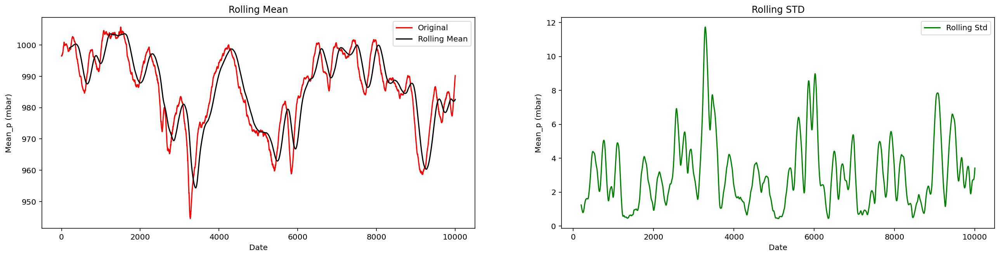

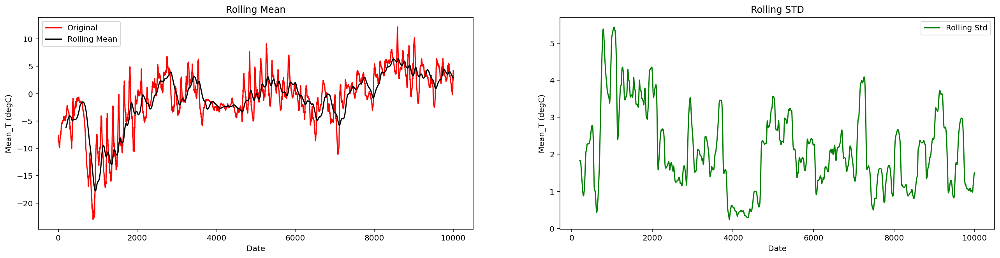

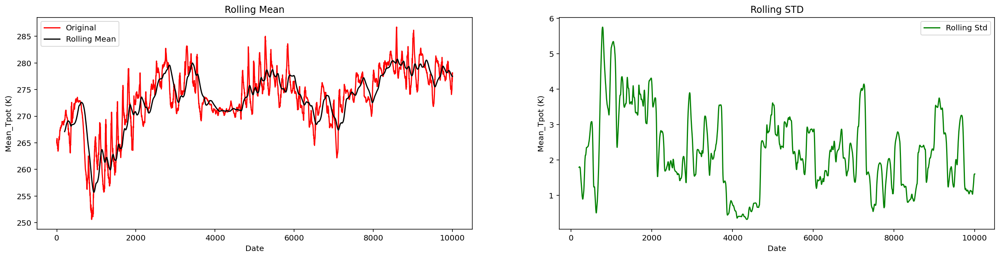

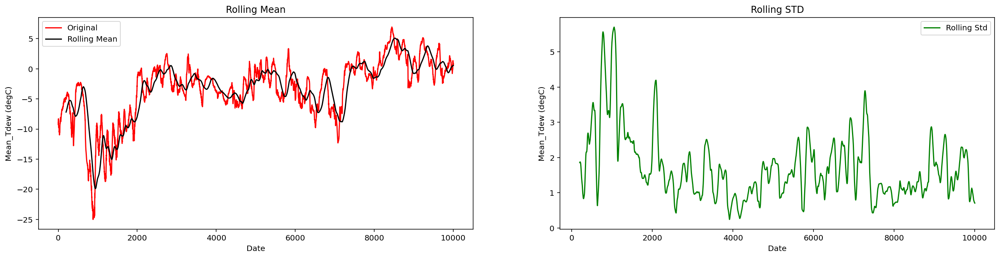

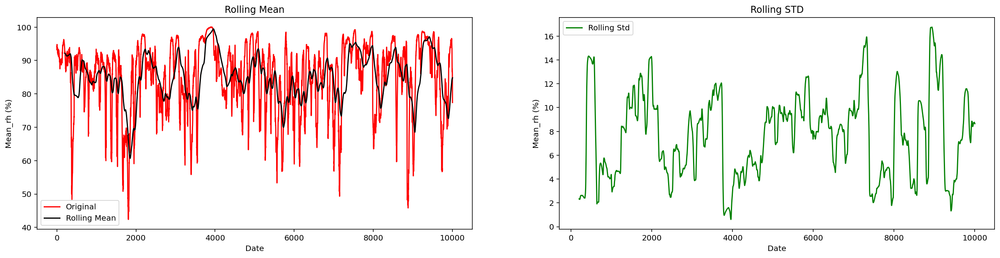

...

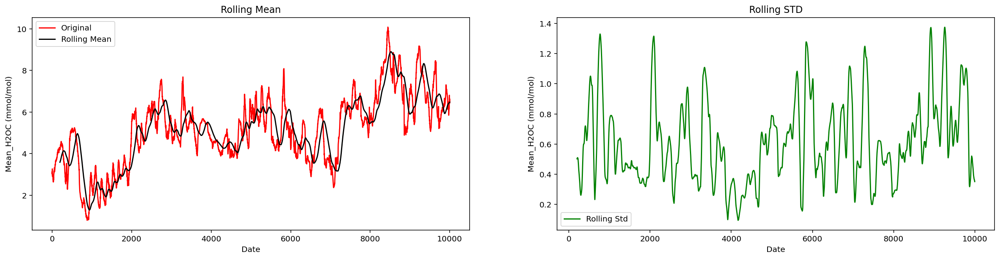

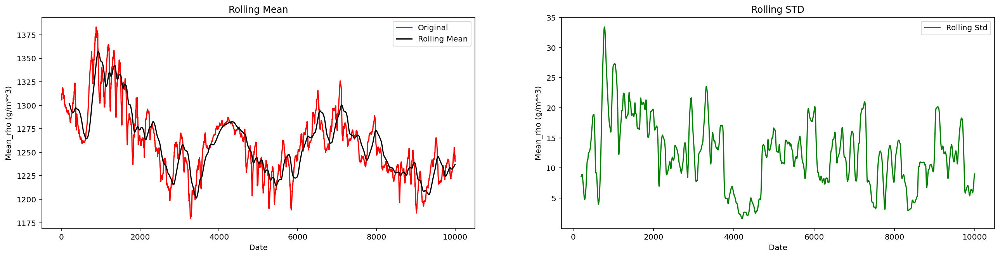

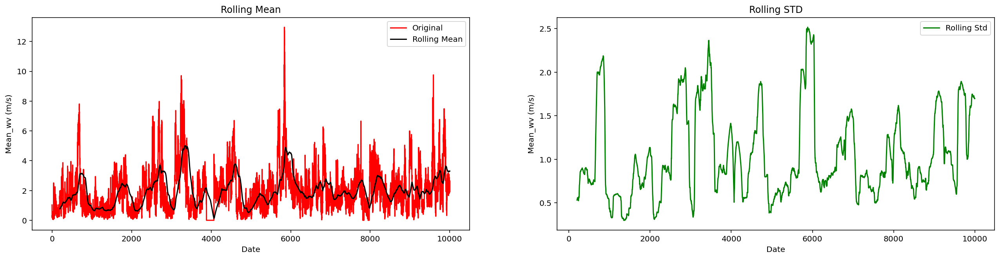

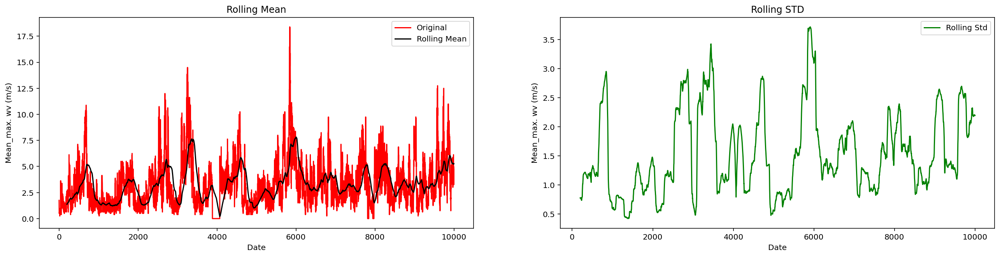

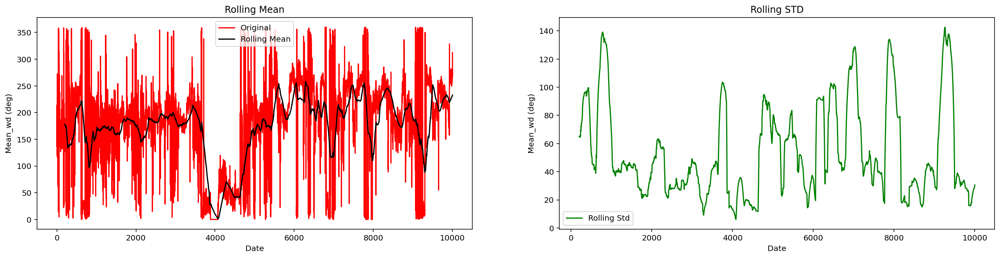

In [37]:
for col in cols:
    check_mean_std(df[col][0:10000], windo=200, col_name=col)

check out roll mean and std fot all data with roll back window = 1000

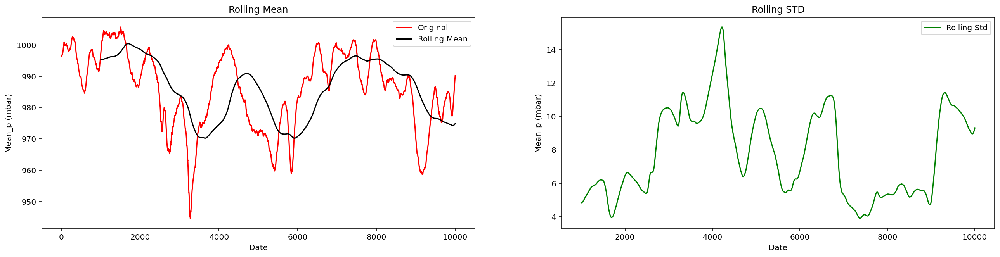

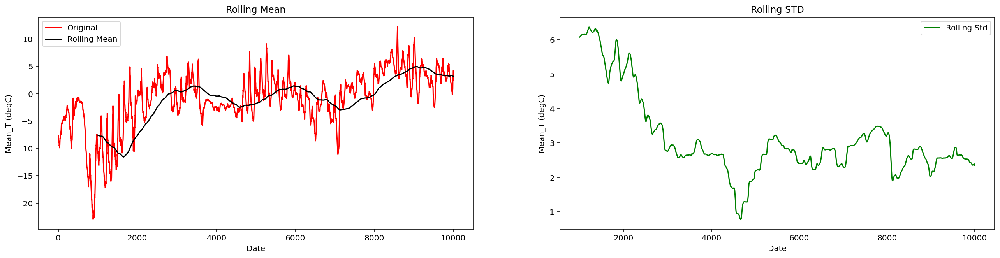

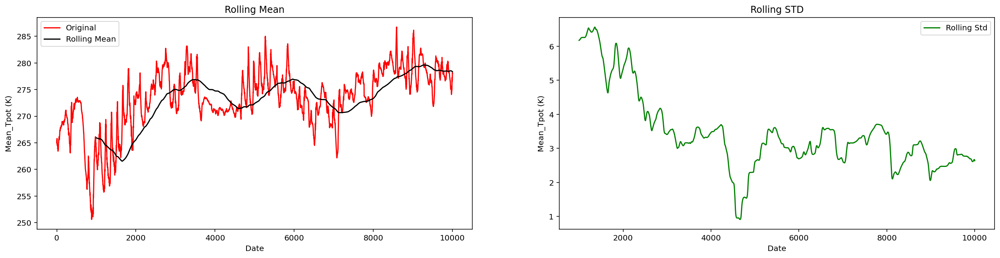

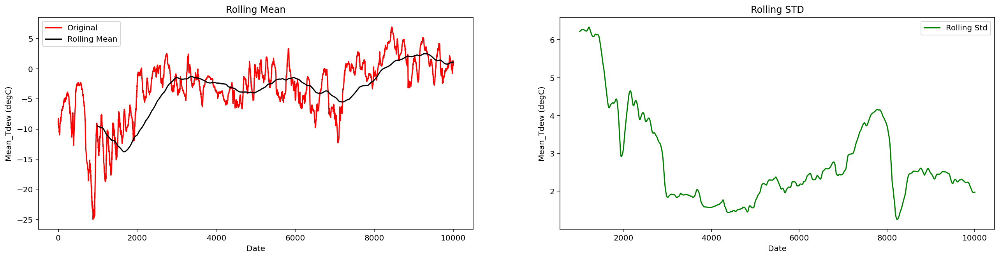

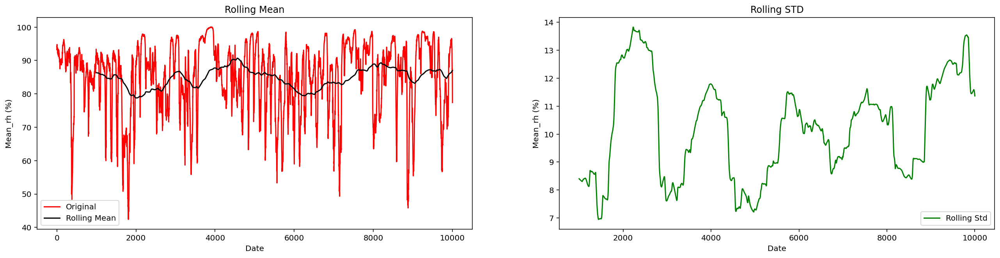

...

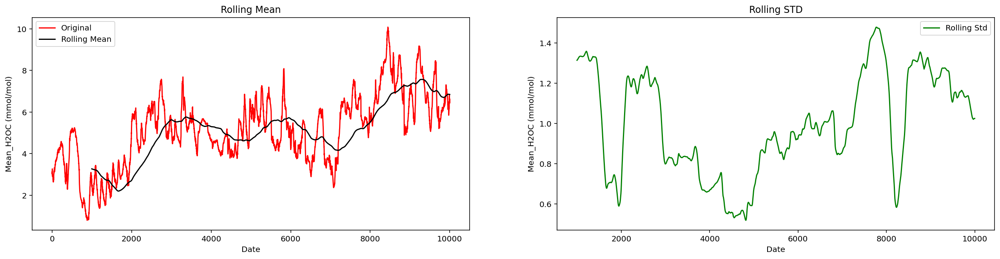

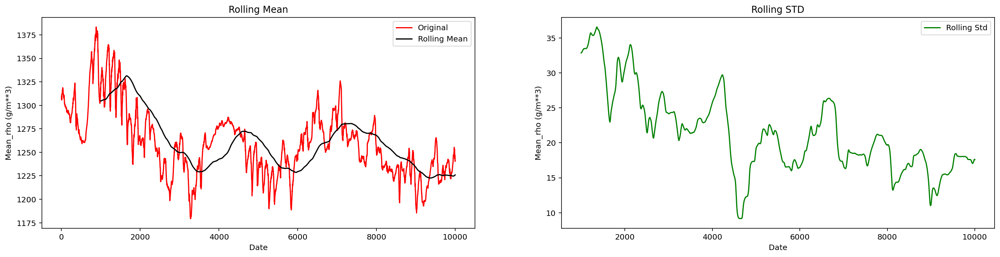

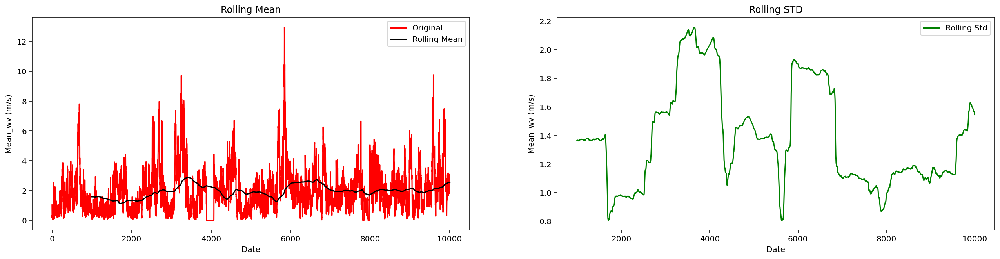

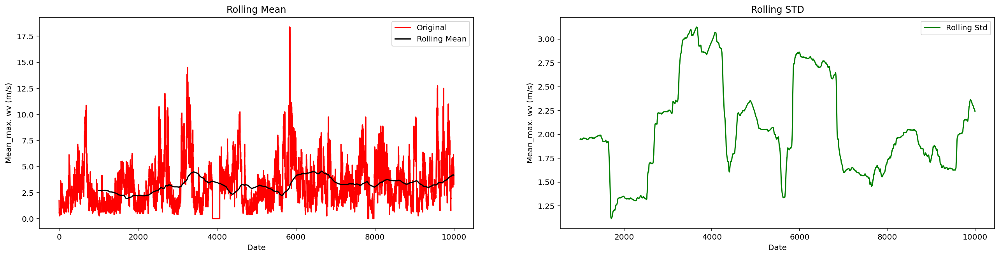

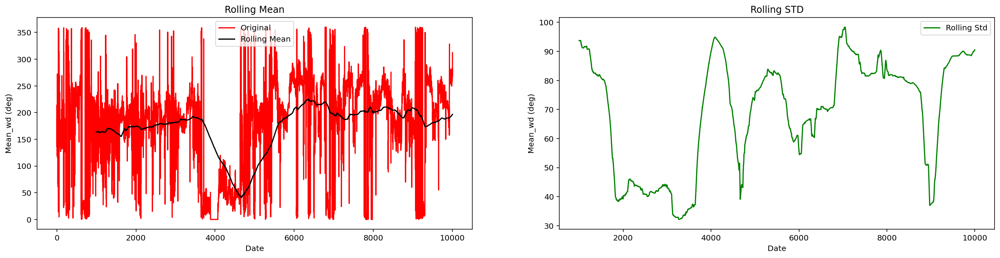

In [38]:
for col in cols:
    check_mean_std(df[col][0:10000], windo=1000, col_name=col)

checking out the adfuller method on data

In [99]:
for col in cols:
    
    print(30*"=", col, 30*"=","\n")
    
    check_adfuller(df[col][0:100_000])

============================== p (mbar) ============================== 

Test statistic:  -12.990582118066978
p-value:  2.8180569490639252e-24
Critical Values: {'1%': -3.4304154365591524, '5%': -2.861568921933749, '10%': -2.5667853941333254}
============================== T (degC) ============================== 

Test statistic:  -7.447276447909886
p-value:  5.7936666368047076e-11
Critical Values: {'1%': -3.4304154398333235, '5%': -2.861568923380865, '10%': -2.5667853949035773}
============================== Tpot (K) ============================== 

Test statistic:  -7.648456915110901
p-value:  1.8160041517080462e-11
Critical Values: {'1%': -3.4304154398333235, '5%': -2.861568923380865, '10%': -2.5667853949035773}
============================== Tdew (degC) ============================== 

Test statistic:  -6.620767921463179
p-value:  6.0452331920868085e-09
Critical Values: {'1%': -3.430415424120289, '5%': -2.861568916436027, '10%': -2.5667853912070697}
============================== rh

based on adfuller test all data are stationary with 99% confidence.

In case of having non stationary data, several approaches can be applied to fix the data.
There are two reasons for having non-stationary data including seanility and trend.
The data has trend when the data mean (is function of window size) varied versus time and seanality is cycles that are repeat over time.

Let's move an average with a window (data from the past) and compare it with the data. Moving average is one common methods while appraoching non-stationary data. For that a new plot function is defined at the following which takes the data along with a list of different window sizes and it plots all in one figure.

In [39]:
def hist_windo_mean(col_name, windo, colorss):
    
    rolmean = pd.Series(df[col_name]).rolling(window=windo).mean()
    rool_mean = pd.DataFrame(rolmean)
    plt.hist(rool_mean, log=True, label=f'Rolling Mean_window_{windo}',color=colorss)
#     plt.xlim(0,)
    plt.xlabel(col_name),plt.ylabel("counts")
    plt.legend()
def hist_windo_std(col_name, windo, colorss):
    
    rolstd = pd.Series(df[col_name]).rolling(window=windo).std()
    rool_std = pd.DataFrame(rolstd)
    plt.hist(rool_std, log=True, label=f'Rolling std_window_{windo}',color=colorss)
    plt.xlabel(col_name),plt.ylabel("counts")
    plt.legend()

# check_mean_std
def check_mean_std(ts, windo, col_name, colorss):
    
    #Rolling statistics mean
    plt.figure(figsize=(22,6))   
    orig = plt.plot(ts, color='r',
                    label='Original')
    for i,win in enumerate(windo):
        

        rolmean = pd.Series(ts).rolling(window=win).mean()
        mean = plt.plot(rolmean, color=colorss[i], 
                        label=f'Rolling Mean_window_{win}')
          
        plt.xlabel("Date")
        plt.ylabel(f"Mean_{col_name}")
        plt.title('Rolling Mean')
        plt.legend()
        
    col_name = col_name.replace(' ', '_')
    col_name = col_name.replace('/', '_')
    addres = '../Figures/'
    plt.savefig(addres +  section_fig_main_title + f'fixing_mean_stationary_windo_{windo}_{col_name}.png')
    plt.show()

    
    
    
    
    # mean hist plots
    plt.figure(figsize=(22,6))
    col_name = col_name.replace('_',' ')
    col_name = col_name.replace('_','/')
    for i,win in enumerate(windo):
        
        rolmean = pd.Series(df[col_name]).rolling(window=win).mean()
        rool_mean = pd.DataFrame(rolmean)
        sns.set_style('darkgrid')
        sns.distplot(rolmean, color=colorss[i], 
                     label=f'window_{win}')
        plt.legend()
        
    col_name = col_name.replace(' ', '_')
    col_name = col_name.replace('/', '_')
    addres = '../Figures/'
    plt.savefig(addres +  section_fig_main_title + f'fixing_mean_stationary_HIST_windo_{windo}_{col_name}.png')
    plt.show()
#         plt.subplot(1, 3, i+1)
#         hist_windo_mean(col_name, win, colorss[i]) 
        

        
        
        
        
    #Rolling statistics std 
    plt.figure(figsize=(22,6)) 
    for i,win in enumerate(windo):

#             rolmean = pd.Series(ts).rolling(window=win).mean()
        rolstd = pd.Series(ts).rolling(window=win).std()
        std = plt.plot(rolstd, color=colorss[i], 
           label = f'Rolling Std_win_{win}')
            
            
        plt.xlabel("Date")
        plt.ylabel(f"std_{col_name}")
        plt.title('Rolling std')
        plt.legend()

    col_name = col_name.replace(' ', '_')
    col_name = col_name.replace('/', '_')
    addres = '../Figures/'
    plt.savefig(addres +  section_fig_main_title + f'fixing__stdstationary_windo_{windo}_{col_name}.png')

    plt.show()
    
    
    
    
    
    
    #std hist plots
    plt.figure(figsize=(22,6))
    col_name = col_name.replace('_',' ')
    col_name = col_name.replace('_','/')
    for i,win in enumerate(windo):
        
        
        rolstd = pd.Series(df[col_name]).rolling(window=win).std()
        rool_std = pd.DataFrame(rolstd)
        sns.set_style('darkgrid')
        sns.distplot(rolstd, color=colorss[i], 
                     label=f'window_{win}')
        plt.legend()
        
    col_name = col_name.replace(' ', '_')
    col_name = col_name.replace('/', '_')
    addres = '../Figures/'
    plt.savefig(addres +  section_fig_main_title + f'fixing_std_stationary_HIST_windo_{windo}_{col_name}.png')
    plt.show()
#         plt.subplot(1, 3, i+1)
#         hist_windo_std(col_name, win, colorss[i]) 


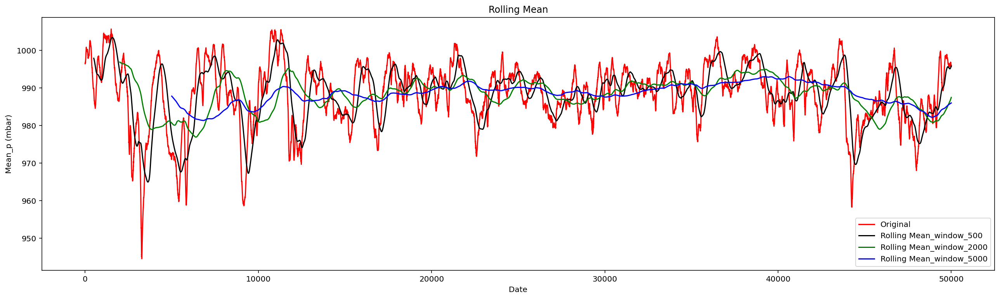

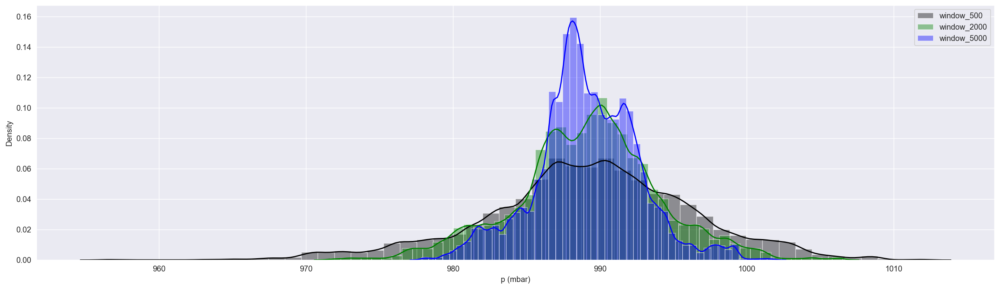

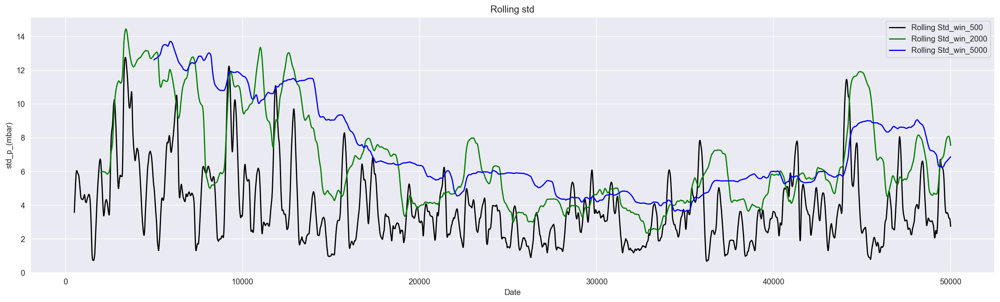

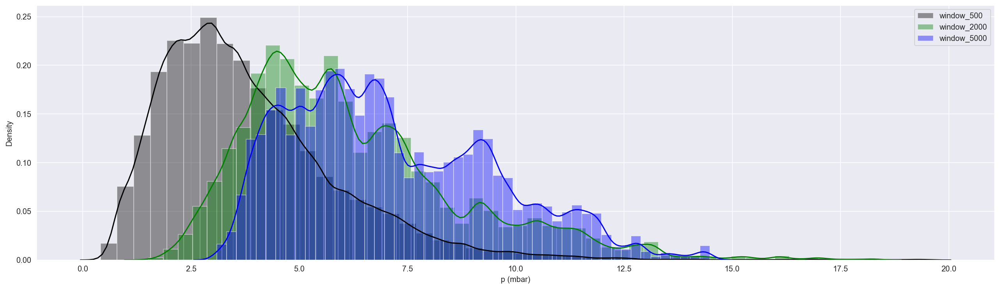

In [40]:
windo = [500,2000, 5000]
col_name = 'p (mbar)'
ts = df[col_name][0:50000]
colorss = ['k', 'g', 'b']


check_mean_std(ts, windo, col_name, colorss)

clearly moving average affects the std and the mean of data and as it is observed depends on the window size. As the data is averaged along the large window, the data variation range is decreased.

same analysis for temperature data

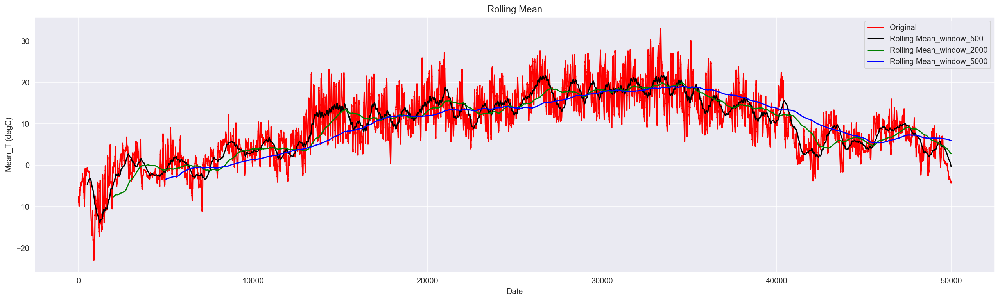

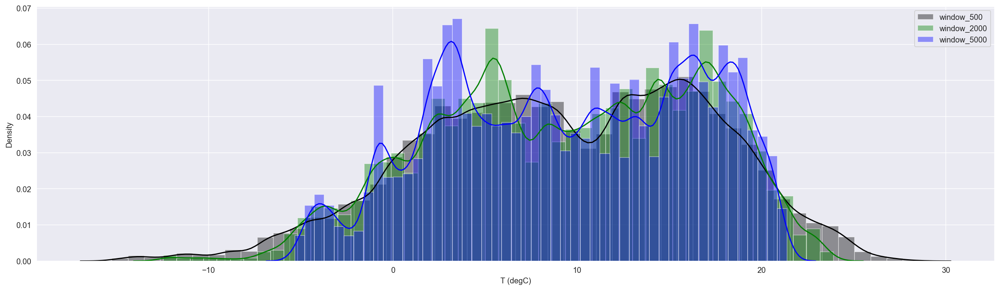

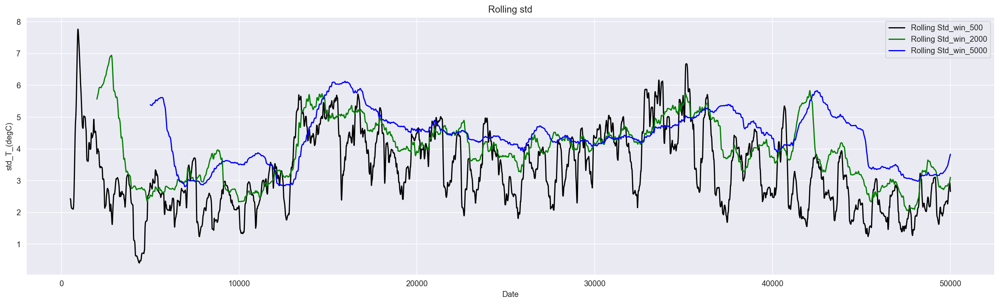

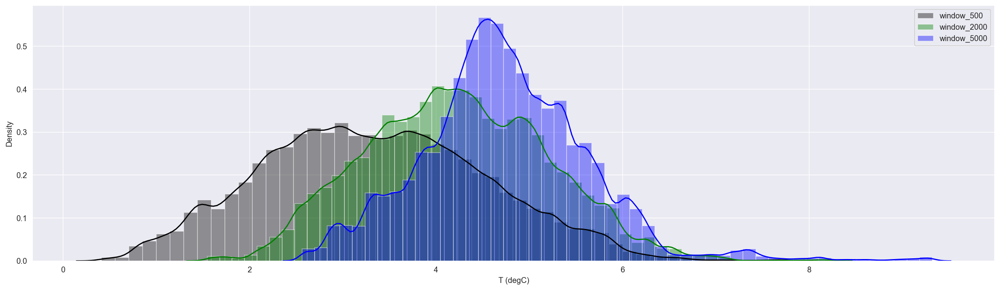

In [41]:
windo = [500,2000, 5000]
col_name = 'T (degC)'
ts = df[col_name][0:50000]
colorss = ['k', 'g', 'b']


check_mean_std(ts, windo, col_name, colorss)